In [5]:
import numpy as np
import pandas as pd
import glob
import matplotlib.pyplot as plt
%matplotlib inline
from skimage import io
import collections
from wordcloud import WordCloud,STOPWORDS
import seaborn as sns

#Import all the required libraries

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt #for plotting graphs
import seaborn as sns 
import glob
import string

from skimage import io
pd.set_option('display.max_colwidth',None) # Set the max column width to see the complete caption

import collections
from wordcloud import WordCloud,STOPWORDS

import tensorflow as tf
import keras
from keras.preprocessing.image import load_img
import string
import time
from sklearn.model_selection import train_test_split
from keras.preprocessing.text import Tokenizer

from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras.models import Model
from tensorflow.keras import layers
from tensorflow.keras import activations
from tensorflow.keras import Input
from tqdm import tqdm
from PIL import Image

from gtts import gTTS
from playsound import playsound
from IPython import display

In [6]:
df = pd.read_csv("captions.csv")
df

,image,caption
0,1000092795.jpg,Two young guys with shaggy hair look at their hands while hanging out in the yard .
1,1000092795.jpg,"Two young , White males are outside near many bushes ."
2,1000092795.jpg,Two men in green shirts are standing in a yard .
3,1000092795.jpg,A man in a blue shirt standing in a garden .
4,1000092795.jpg,Two friends enjoy time spent together .
...,...,...
158910,998845445.jpg,"A man in shorts and a Hawaiian shirt leans over the rail of a pilot boat , with fog and mountains in the background ."
158911,998845445.jpg,"A young man hanging over the side of a boat , which is in a like with fog rolling over a hill behind it ."
158912,998845445.jpg,A man is leaning off of the side of a blue and white boat as it sits in a body of water .
158913,998845445.jpg,"A man riding a small boat in a harbor , with fog and mountains in the background ."


In [7]:
#Import the dataset and read the image into a seperate variable
images='/Users/dhruv/tensorflow-test/Flickr30K/Images'

In [8]:
all_imgs = glob.glob(images + '/*.jpg',recursive=True)
print("The total images present in the dataset: {}".format(len(all_imgs)))

The total images present in the dataset: 31783


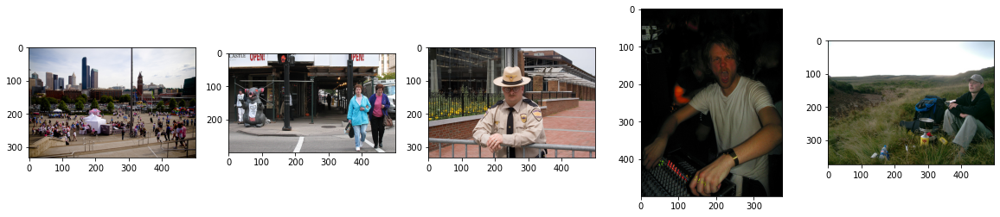

In [9]:
#Visualise both the images & text present in the dataset

#Visualising first 5 images:

Display_Images= all_imgs[0:5]
figure, axes = plt.subplots(1,5)
figure.set_figwidth(20)
   
for ax,image in zip(axes, Display_Images):
    ax.imshow(io.imread(image), cmap=None)

In [10]:
df

,image,caption
0,1000092795.jpg,Two young guys with shaggy hair look at their hands while hanging out in the yard .
1,1000092795.jpg,"Two young , White males are outside near many bushes ."
2,1000092795.jpg,Two men in green shirts are standing in a yard .
3,1000092795.jpg,A man in a blue shirt standing in a garden .
4,1000092795.jpg,Two friends enjoy time spent together .
...,...,...
158910,998845445.jpg,"A man in shorts and a Hawaiian shirt leans over the rail of a pilot boat , with fog and mountains in the background ."
158911,998845445.jpg,"A young man hanging over the side of a boat , which is in a like with fog rolling over a hill behind it ."
158912,998845445.jpg,A man is leaning off of the side of a blue and white boat as it sits in a body of water .
158913,998845445.jpg,"A man riding a small boat in a harbor , with fog and mountains in the background ."


In [11]:
folder_path = '/Users/dhruv/tensorflow-test/Flickr30K/Images/'

In [12]:
df["path"] = df["image"].apply(lambda x: folder_path+x)

In [13]:
df

,image,caption,path
0,1000092795.jpg,Two young guys with shaggy hair look at their hands while hanging out in the yard .,/Users/dhruv/tensorflow-test/Flickr30K/Images/1000092795.jpg
1,1000092795.jpg,"Two young , White males are outside near many bushes .",/Users/dhruv/tensorflow-test/Flickr30K/Images/1000092795.jpg
2,1000092795.jpg,Two men in green shirts are standing in a yard .,/Users/dhruv/tensorflow-test/Flickr30K/Images/1000092795.jpg
3,1000092795.jpg,A man in a blue shirt standing in a garden .,/Users/dhruv/tensorflow-test/Flickr30K/Images/1000092795.jpg
4,1000092795.jpg,Two friends enjoy time spent together .,/Users/dhruv/tensorflow-test/Flickr30K/Images/1000092795.jpg
...,...,...,...
158910,998845445.jpg,"A man in shorts and a Hawaiian shirt leans over the rail of a pilot boat , with fog and mountains in the background .",/Users/dhruv/tensorflow-test/Flickr30K/Images/998845445.jpg
158911,998845445.jpg,"A young man hanging over the side of a boat , which is in a like with fog rolling over a hill behind it .",/Users/dhruv/tensorflow-test/Flickr30K/Images/998845445.jpg
158912,998845445.jpg,A man is leaning off of the side of a blue and white boat as it sits in a body of water .,/Users/dhruv/tensorflow-test/Flickr30K/Images/998845445.jpg
158913,998845445.jpg,"A man riding a small boat in a harbor , with fog and mountains in the background .",/Users/dhruv/tensorflow-test/Flickr30K/Images/998845445.jpg


In [14]:
#store all the image id here
image_name = list(df["image"])
#store all the image path here
image_path = list(df["path"])
#store all the captions here
annotations = list(df["caption"])

In [15]:
len(annotations)

158915

In [16]:
vocabulary= [word for line in annotations for word in line.split()]
vocabulary

['Two',
 'young',
 'guys',
 'with',
 'shaggy',
 'hair',
 'look',
 'at',
 'their',
 'hands',
 'while',
 'hanging',
 'out',
 'in',
 'the',
 'yard',
 '.',
 'Two',
 'young',
 ',',
 'White',
 'males',
 'are',
 'outside',
 'near',
 'many',
 'bushes',
 '.',
 'Two',
 'men',
 'in',
 'green',
 'shirts',
 'are',
 'standing',
 'in',
 'a',
 'yard',
 '.',
 'A',
 'man',
 'in',
 'a',
 'blue',
 'shirt',
 'standing',
 'in',
 'a',
 'garden',
 '.',
 'Two',
 'friends',
 'enjoy',
 'time',
 'spent',
 'together',
 '.',
 'Several',
 'men',
 'in',
 'hard',
 'hats',
 'are',
 'operating',
 'a',
 'giant',
 'pulley',
 'system',
 '.',
 'Workers',
 'look',
 'down',
 'from',
 'up',
 'above',
 'on',
 'a',
 'piece',
 'of',
 'equipment',
 '.',
 'Two',
 'men',
 'working',
 'on',
 'a',
 'machine',
 'wearing',
 'hard',
 'hats',
 '.',
 'Four',
 'men',
 'on',
 'top',
 'of',
 'a',
 'tall',
 'structure',
 '.',
 'Three',
 'men',
 'on',
 'a',
 'large',
 'rig',
 '.',
 'A',
 'child',
 'in',
 'a',
 'pink',
 'dress',
 'is',
 'climbin

In [17]:
#Create the vocabulary & the counter for the captions
vocabulary= [word.lower() for line in annotations for word in line.split()] #We can see that we had both
word_count=collections.Counter(vocabulary)
word_count

Counter({'two': 21641,
         'young': 13218,
         'guys': 658,
         'with': 36208,
         'shaggy': 51,
         'hair': 2221,
         'look': 1328,
         'at': 16258,
         'their': 4037,
         'hands': 1556,
         'while': 11710,
         'hanging': 662,
         'out': 3432,
         'in': 83466,
         'the': 62977,
         'yard': 394,
         '.': 151038,
         ',': 25331,
         'white': 13179,
         'males': 248,
         'are': 20196,
         'outside': 4701,
         'near': 3016,
         'many': 1290,
         'bushes': 95,
         'men': 9498,
         'green': 5222,
         'shirts': 942,
         'standing': 9113,
         'a': 271699,
         'man': 42598,
         'blue': 11310,
         'shirt': 12981,
         'garden': 247,
         'friends': 398,
         'enjoy': 204,
         'time': 314,
         'spent': 2,
         'together': 1783,
         'several': 2105,
         'hard': 645,
         'hats': 836,
         'operat

a :  271699
. :  151038
in :  83466
the :  62977
on :  45671
and :  44264
man :  42598
is :  41116
of :  38776
with :  36208
, :  25331
woman :  22211
two :  21641
are :  20196
to :  17607
people :  17337
at :  16258
an :  15882
wearing :  15709
young :  13218
white :  13179
shirt :  12981
black :  12312
while :  11710
his :  11495


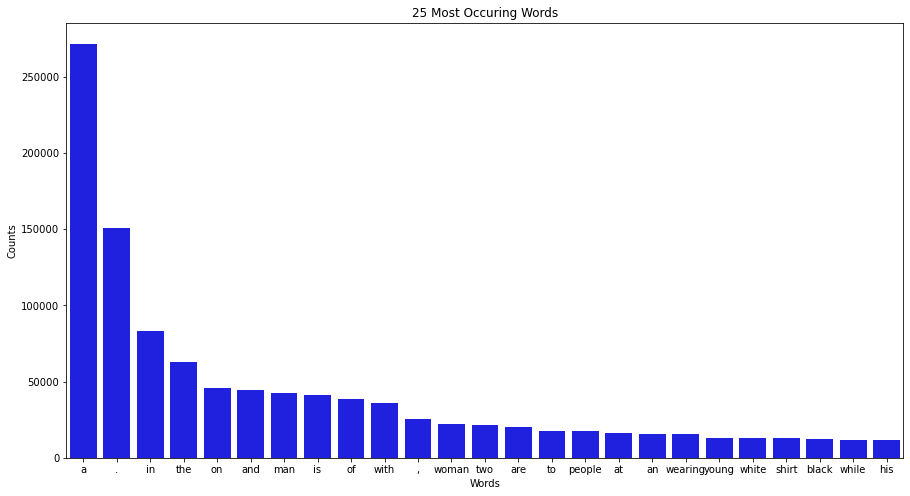

In [18]:
#Visualise the top 25 occuring words in the captions
for word, count in word_count.most_common(25):
    print(word, ": ", count)

plt.figure(figsize=(15,8))
lst = word_count.most_common(25)
most_common_words_df = pd.DataFrame(lst, columns = ['Word', 'Count'])
sns.barplot(x=most_common_words_df["Word"], y=most_common_words_df["Count"], color="blue")
plt.title("25 Most Occuring Words")
plt.xlabel("Words")
plt.ylabel("Counts")
plt.show()

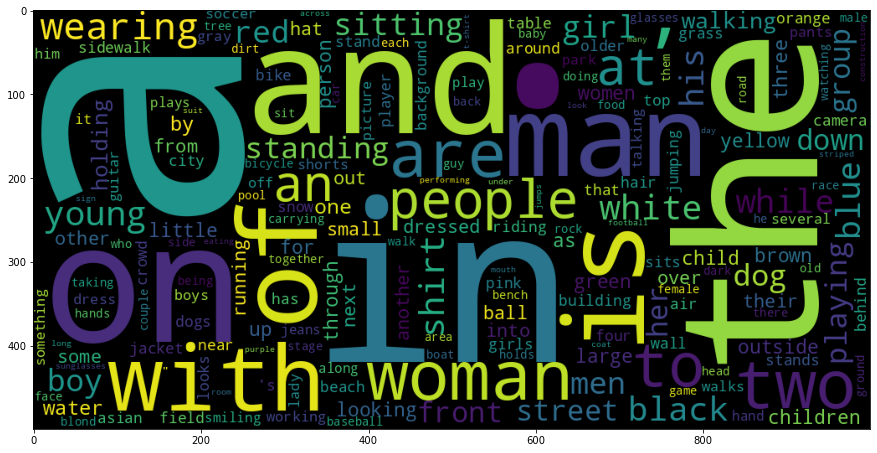

In [19]:
wordcloud = WordCloud(width = 1000, height = 500).generate_from_frequencies(word_count)
plt.figure(figsize=(15,8))
plt.imshow(wordcloud)
plt.show()

man :  42598
woman :  22211
two :  21641
people :  17337
wearing :  15709
young :  13218
white :  13179
shirt :  12981
black :  12312
blue :  11310
red :  9916
girl :  9655
sitting :  9620
men :  9498
boy :  9429
standing :  9113
dog :  9090
playing :  8620
street :  7998
group :  7851
front :  7604
walking :  7339
holding :  6985
one :  6484
water :  5957
three :  5770


(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25]),
 [Text(0, 0, 'man'),
  Text(1, 0, 'woman'),
  Text(2, 0, 'two'),
  Text(3, 0, 'people'),
  Text(4, 0, 'wearing'),
  Text(5, 0, 'young'),
  Text(6, 0, 'white'),
  Text(7, 0, 'shirt'),
  Text(8, 0, 'black'),
  Text(9, 0, 'blue'),
  Text(10, 0, 'red'),
  Text(11, 0, 'girl'),
  Text(12, 0, 'sitting'),
  Text(13, 0, 'men'),
  Text(14, 0, 'boy'),
  Text(15, 0, 'standing'),
  Text(16, 0, 'dog'),
  Text(17, 0, 'playing'),
  Text(18, 0, 'street'),
  Text(19, 0, 'group'),
  Text(20, 0, 'front'),
  Text(21, 0, 'walking'),
  Text(22, 0, 'holding'),
  Text(23, 0, 'one'),
  Text(24, 0, 'water'),
  Text(25, 0, 'three')])

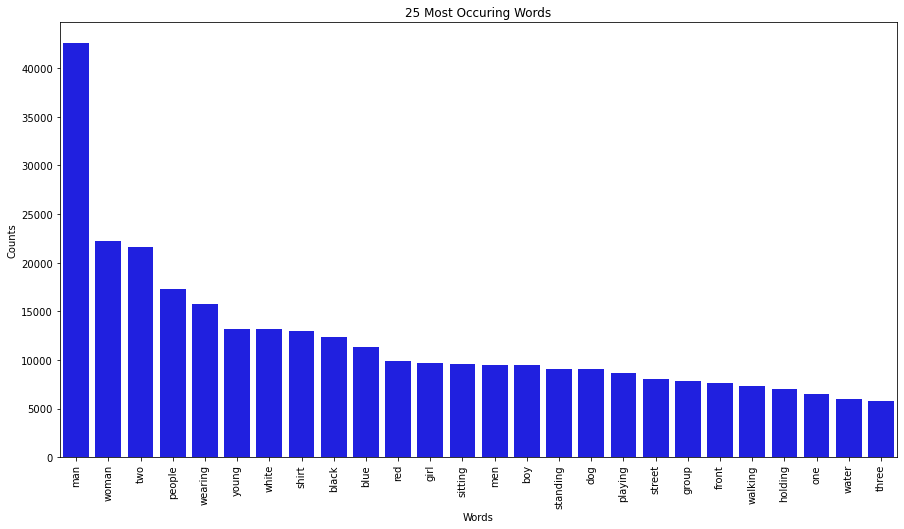

In [20]:
for word, count in word_count.most_common(45):
    if word not in STOPWORDS:
        if word not in string.punctuation:
            print(word, ": ", count)

dictionary_without_stopwords = {}
for word, count in word_count.most_common(45):
    if word not in STOPWORDS:
        if word not in string.punctuation:
            dictionary_without_stopwords[word] = count

plt.figure(figsize=(15,8))
most_common_without_stopwords_df = pd.DataFrame(dictionary_without_stopwords.items(), columns=['Words', 'Counts'])
sns.barplot(x=most_common_without_stopwords_df["Words"], y=most_common_without_stopwords_df["Counts"], color="blue")
plt.title("25 Most Occuring Words")
plt.xlabel("Words")
plt.ylabel("Counts")
plt.xticks(rotation=90)

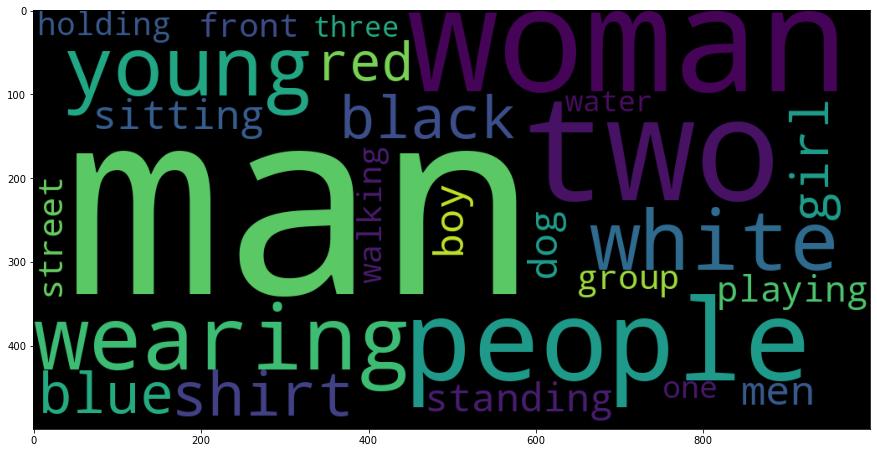

In [21]:
wordcloud = WordCloud(width = 1000, height = 500).generate_from_frequencies(dictionary_without_stopwords)
plt.figure(figsize=(15,8))
plt.imshow(wordcloud)
plt.show()

In [22]:
caption_df=df.copy()
caption_df['caption_word_count'] = caption_df["caption"].str.split().str.len()

In [23]:
mean = sum(caption_df['caption_word_count'])/len(caption_df['caption_word_count'])
mean

13.389453481420885

/Users/dhruv/tensorflow-test/env/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


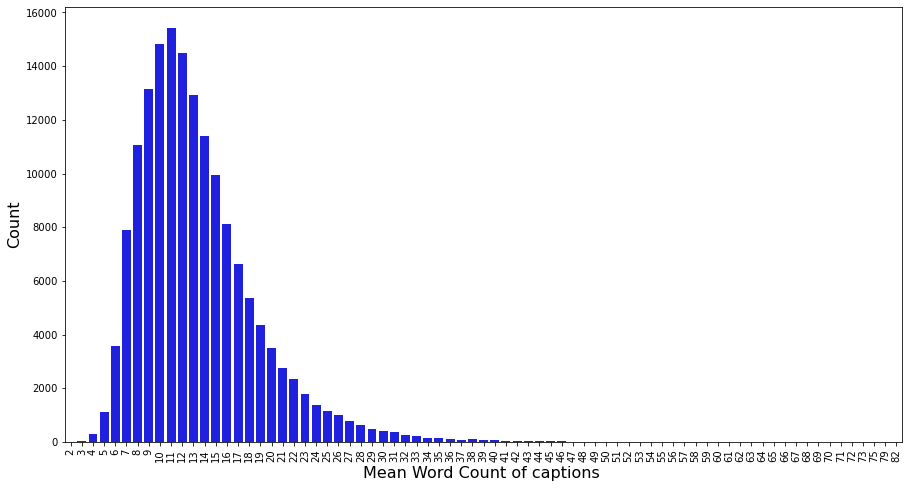

In [24]:
plt.figure(figsize=(15, 8))
ax = sns.countplot(caption_df['caption_word_count'], color="blue")
plt.xlabel('Mean Word Count of captions ', fontsize=16)
plt.ylabel('Count', fontsize=16)
plt.xticks(rotation=90)
plt.show()

In [25]:
median = np.median(caption_df['caption_word_count'])
median

12.0

/Users/dhruv/tensorflow-test/env/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


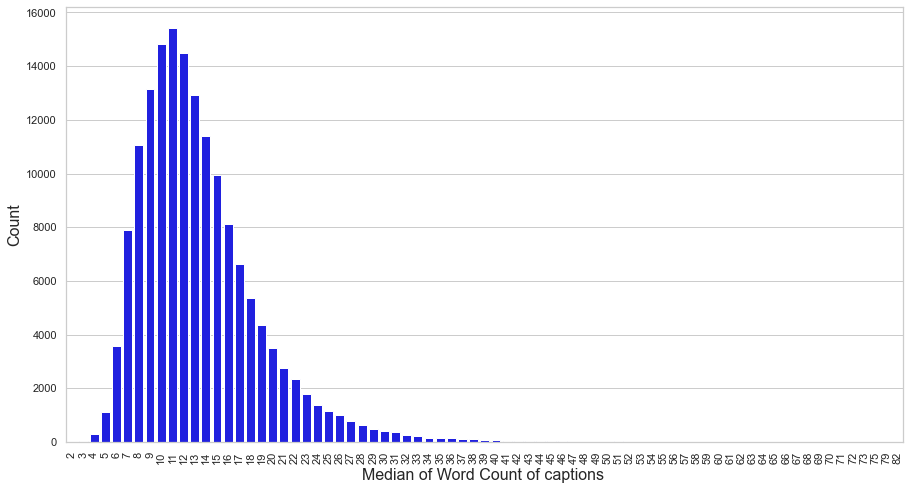

In [28]:
sns.set(style="whitegrid", font_scale = 1)
plt.figure(figsize=(15, 8))
ax = sns.countplot(caption_df['caption_word_count'], color="blue")
plt.xlabel('Median of Word Count of captions ', fontsize=16)
plt.ylabel('Count', fontsize=16)
plt.xticks(rotation=90)
plt.show()

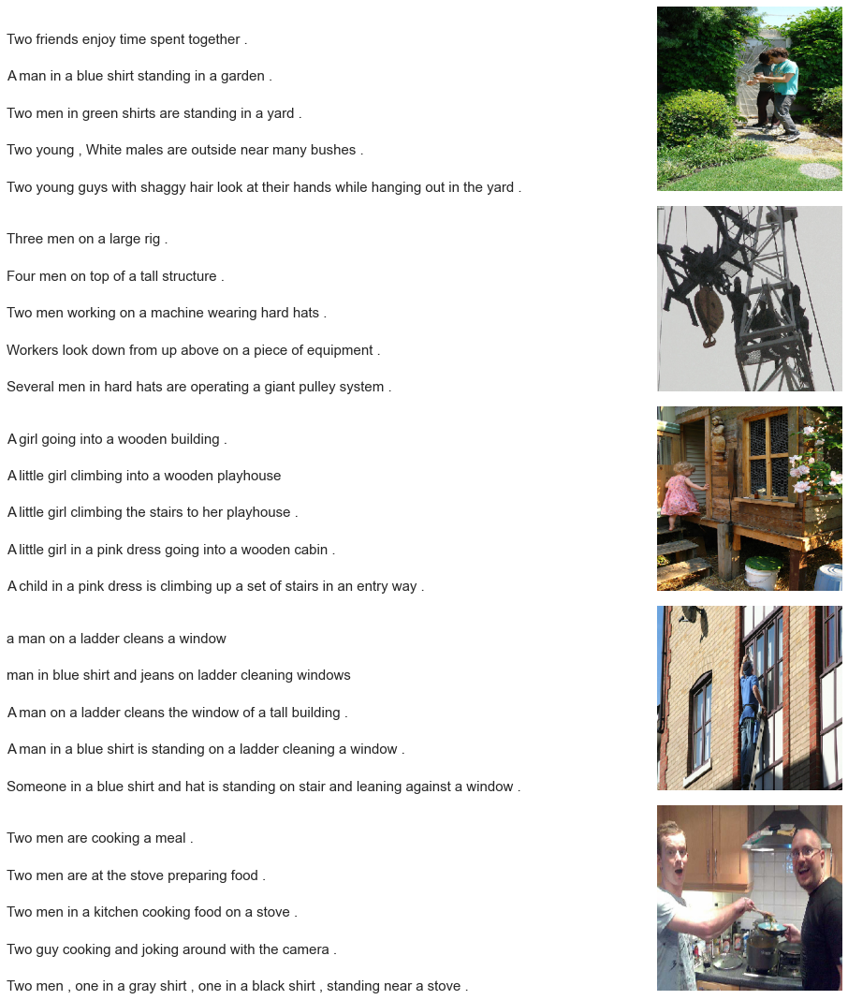

In [29]:
# Images 

fig = plt.figure(figsize=(15,15)) # For dosplaying image
count = 1
    
for Path in df[:25].path.unique(): # Loading 1st 25 paths which will have 5 distinct images
    captions = list(df["caption"].loc[df.path== Path].values)
    display_image = load_img(Path,target_size=(299,299,3))
    ax = fig.add_subplot(5,2,count) #Adding a subplot that spans 5 rows:
    plt.axis('off')  # we don't want both x and y axes for caption 
    ax.plot()
    ax.set_xlim(0,1)
    ax.set_ylim(0,len(captions)) #to decide the spacing between each line of caption
    for i, caption in enumerate(captions):
        ax.text(0,i,caption,fontsize=15)  #to display the captions         
    count+=1
    plt.tight_layout() #to make sure that image and caption don't overlap

    ax = fig.add_subplot(5,2,count)
    ax.imshow(display_image)
    plt.axis('off')
    count +=1

plt.show()

In [30]:
# Data cleaning
# prepare translation table for removing punctuation
remove_punctuation = str.maketrans('', '', string.punctuation)
for i in range(len(annotations)):
    line = annotations[i]
    line = line.split()
    line = [word.lower() for word in line] # convert to lower case
    line = [word.translate(remove_punctuation) for word in line]# remove punctuation from each token
    line = [word for word in line if len(word)>1] # remove hanging 's' and 'a'
    line = [word for word in line if word.isalpha()]# remove tokens with numbers in them
    annotations[i]=  ' '.join(line)   # store as string

In [31]:
#Create a list which contains all the captions

#add the <start> & <end> token to all those captions as well
annotations=['<start>' + ' ' +  line + ' ' + '<end>' for line in annotations]

#Create a list which contains all the path to the images
all_img_path= image_path

print("Total captions present in the dataset: "+ str(len(annotations)))
print("Total images present in the dataset: " + str(len(all_img_path)))

Total captions present in the dataset: 158915
Total images present in the dataset: 158915


In [32]:
annotations[0:5]

['<start> two young guys with shaggy hair look at their hands while hanging out in the yard <end>',
 '<start> two young white males are outside near many bushes <end>',
 '<start> two men in green shirts are standing in yard <end>',
 '<start> man in blue shirt standing in garden <end>',
 '<start> two friends enjoy time spent together <end>']

In [33]:
top_voc = 5000
tokenizer =Tokenizer(num_words=top_voc+1,filters='!"#$%&()*+.,-/:;=?@[\]^_`{|}~ ',
                                                  lower=True, char_level=False,
                                                  oov_token="UNK")


# Create word-to-index and index-to-word mappings.

tokenizer.fit_on_texts(annotations) #Updates internal vocabulary based on a list of texts.

train_seqs = tokenizer.texts_to_sequences(annotations)#Transforms each text in texts to a sequence of integers.

# when we use the pad_sequence to process the sequence, we will be using 0 as the padding value.
# In order to distinguish between PAD and UNKNOWN, keras use different index for UNKNOWN.

# 0 is a reserved index that won't be assigned to any word.Let's add PAD token for zero

tokenizer.word_index['PAD'] = 0
tokenizer.index_word[0] = 'PAD'

In [34]:
print(tokenizer.oov_token)
print(tokenizer.index_word[0])

UNK
PAD


In [35]:
tokenizer.index_word

{1: 'UNK',
 2: '<start>',
 3: '<end>',
 4: 'in',
 5: 'the',
 6: 'on',
 7: 'and',
 8: 'man',
 9: 'is',
 10: 'of',
 11: 'with',
 12: 'woman',
 13: 'two',
 14: 'are',
 15: 'to',
 16: 'people',
 17: 'at',
 18: 'an',
 19: 'wearing',
 20: 'young',
 21: 'white',
 22: 'shirt',
 23: 'black',
 24: 'while',
 25: 'his',
 26: 'blue',
 27: 'red',
 28: 'girl',
 29: 'sitting',
 30: 'men',
 31: 'boy',
 32: 'standing',
 33: 'dog',
 34: 'playing',
 35: 'street',
 36: 'group',
 37: 'down',
 38: 'front',
 39: 'her',
 40: 'walking',
 41: 'holding',
 42: 'one',
 43: 'water',
 44: 'by',
 45: 'three',
 46: 'women',
 47: 'green',
 48: 'up',
 49: 'child',
 50: 'looking',
 51: 'as',
 52: 'for',
 53: 'little',
 54: 'large',
 55: 'outside',
 56: 'yellow',
 57: 'person',
 58: 'children',
 59: 'brown',
 60: 'through',
 61: 'from',
 62: 'their',
 63: 'hat',
 64: 'other',
 65: 'ball',
 66: 'small',
 67: 'next',
 68: 'into',
 69: 'over',
 70: 'some',
 71: 'dressed',
 72: 'out',
 73: 'another',
 74: 'running',
 75: 'buil

In [36]:
tokenizer.word_counts

OrderedDict([('<start>', 158915),
             ('two', 21642),
             ('young', 13218),
             ('guys', 658),
             ('with', 36208),
             ('shaggy', 51),
             ('hair', 2221),
             ('look', 1328),
             ('at', 16259),
             ('their', 4037),
             ('hands', 1556),
             ('while', 11711),
             ('hanging', 662),
             ('out', 3432),
             ('in', 83466),
             ('the', 62978),
             ('yard', 394),
             ('<end>', 158915),
             ('white', 13179),
             ('males', 248),
             ('are', 20196),
             ('outside', 4702),
             ('near', 3016),
             ('many', 1290),
             ('bushes', 95),
             ('men', 9498),
             ('green', 5222),
             ('shirts', 942),
             ('standing', 9113),
             ('man', 42598),
             ('blue', 11310),
             ('shirt', 12981),
             ('garden', 247),
             ('fr

In [37]:
annotations[:5]

['<start> two young guys with shaggy hair look at their hands while hanging out in the yard <end>',
 '<start> two young white males are outside near many bushes <end>',
 '<start> two men in green shirts are standing in yard <end>',
 '<start> man in blue shirt standing in garden <end>',
 '<start> two friends enjoy time spent together <end>']

In [38]:
train_seqs[:5]

[[2, 13, 20, 322, 11, 2098, 108, 184, 17, 62, 156, 24, 321, 72, 4, 5, 486, 3],
 [2, 13, 20, 21, 704, 14, 55, 80, 193, 1416, 3],
 [2, 13, 30, 4, 47, 253, 14, 32, 4, 486, 3],
 [2, 8, 4, 26, 22, 32, 4, 706, 3],
 [2, 13, 481, 805, 591, 1, 135, 3]]

In [39]:
print(len(train_seqs))
print(type(train_seqs))

158915
<class 'list'>


<start> :  158915
<end> :  158915
in :  83466
the :  62978
on :  45671
and :  44264
man :  42598
is :  41117
of :  38776
with :  36208
woman :  22211
two :  21642
are :  20196
to :  17607
people :  17337
at :  16259
an :  15883
wearing :  15709
young :  13218
white :  13179
shirt :  12981
black :  12312
while :  11711
his :  11495
blue :  11310


/var/folders/4b/p7cbbzt54jnfklbw4rpmzjw00000gn/T/ipykernel_46387/3755187690.py:19: MatplotlibDeprecationWarning: The 'b' parameter of grid() has been renamed 'visible' since Matplotlib 3.5; support for the old name will be dropped two minor releases later.
  plt.grid(b=None)


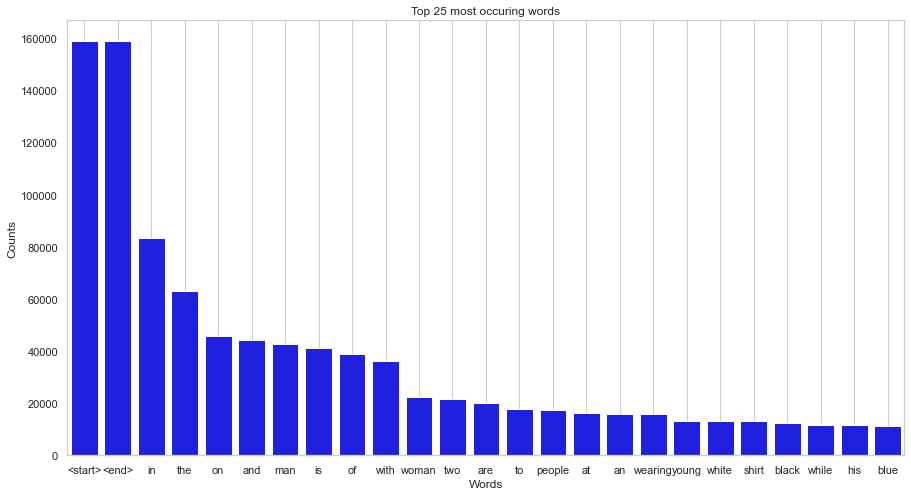

In [40]:
# Create a word count of your tokenizer to visulize the Top 30 occuring words after text processing

#your code here
tokenizer_top_words= [word for line in annotations for word in line.split()]

tokenizer_top_words_count=collections.Counter(tokenizer_top_words)
tokenizer_top_words_count

for word, count in tokenizer_top_words_count.most_common(25):
    print(word, ": ", count)

plt.figure(figsize=(15,8))
token_lst = tokenizer_top_words_count.most_common(25)
most_common_words_df = pd.DataFrame(token_lst, columns = ['Word', 'Count'])
sns.barplot(x=most_common_words_df["Word"], y=most_common_words_df["Count"], color="blue")
plt.title("Top 25 most occuring words")
plt.xlabel("Words")
plt.ylabel("Counts")
plt.grid(b=None)

/var/folders/4b/p7cbbzt54jnfklbw4rpmzjw00000gn/T/ipykernel_46387/987121951.py:4: MatplotlibDeprecationWarning: The 'b' parameter of grid() has been renamed 'visible' since Matplotlib 3.5; support for the old name will be dropped two minor releases later.
  plt.grid(b=None)


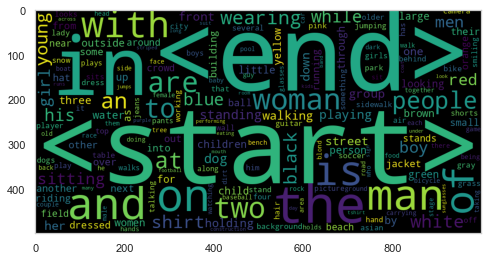

In [41]:
wordcloud_token = WordCloud(width = 1000, height = 500).generate_from_frequencies(tokenizer_top_words_count)
plt.figure(figsize=(8,8))
plt.imshow(wordcloud_token)
plt.grid(b=None)

In [42]:
# Pad each vector to the max_length of the captions ^ store it to a vairable

train_seqs_len=[len(seq) for seq in train_seqs] #storing all lengths in list.Can be used if needed in future
longest_word_length= max(train_seqs_len) #Python list method max returns the elements from the list with maximum value.

# Calculates the longest_word_length to pad all sequences to be the same length as the longest one.

cap_vector= tf.keras.preprocessing.sequence.pad_sequences(train_seqs, padding='post',maxlen=longest_word_length,
                                                          dtype='int32', value=0)

print("The shape of Caption vector is :" + str(cap_vector.shape))

The shape of Caption vector is :(158915, 74)


In [43]:
#checking to know about image format as we will be setting data format as none in tf.keras.applications.inception_v3.preprocess_input

tf.keras.backend.image_data_format() 

'channels_last'

In [44]:
IMAGE_SHAPE= (299, 299)

In [45]:
#write your code here
#Let's see how preprocessed image looks by preprocessing first 5 images alone.
preprocessed_img=[]
for img in all_imgs[0:5]:
    img = tf.io.read_file(img,name=None)
    # by default channels=0 which indictaes to use the number of channels in the JPEG-encoded image.
    img = tf.image.decode_jpeg(img,channels=0) #Since its RGB images,we can give channels=3 also which will output an RGB image.
    img = tf.image.resize(img, IMAGE_SHAPE)
    img = tf.keras.applications.inception_v3.preprocess_input(img,data_format=None)#Default value for data format is None
    # It refers to global setting tf.keras.backend.image_data_format()
    preprocessed_img.append(img)

Metal device set to: Apple M1


2023-05-14 12:25:32.416975: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2023-05-14 12:25:32.417359: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Shape after resize : (299, 299, 3)
Shape after resize : (299, 299, 3)
Shape after resize : (299, 299, 3)
Shape after resize : (299, 299, 3)
Shape after resize : (299, 299, 3)


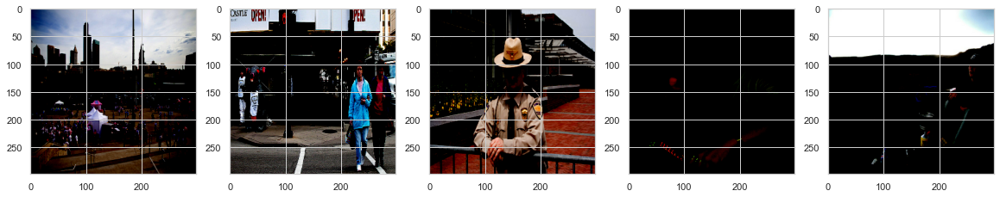

In [46]:
Display_Images= preprocessed_img[0:5]
figure, axes = plt.subplots(1,5)
figure.set_figwidth(20)
   
for ax,image in zip(axes, Display_Images):
    print("Shape after resize :", image.shape)
    ax.imshow(image)
    ax.grid('off')

In [47]:
#write your code here

def preprocess_images_function(image_path):

    img = tf.io.read_file(image_path,name=None)
    # by default channels=0 which indictaes to use the number of channels in the JPEG-encoded image.
    #Since its RGB images,we can give channels=3 also which will output an RGB image.
    img = tf.image.decode_jpeg(img,channels=0) 
    img = tf.image.resize(img, IMAGE_SHAPE)
    img = tf.keras.applications.inception_v3.preprocess_input(img,data_format=None) #Default value for data format is None
    # It refers to global setting tf.keras.backend.image_data_format()
    return img, image_path

In [48]:
#write your code here
# mapping each image full path including name to the function to preprocess the image

# sorting and storing unique path in list which will be given as input 
training_list = sorted(set(image_path)) 

# Creating a Dataset using tf.data.Dataset.from_tensor_slice
New_Image_Data = tf.data.Dataset.from_tensor_slices(training_list)


# Mappng preprocess_images_function across the elements of the above dataset.
# num_parallel_calls= tf.data.AUTOTUNE is used, then the number of parallel calls is set dynamically based on available CPU.
New_Image_Data = New_Image_Data.map(preprocess_images_function, num_parallel_calls=tf.data.experimental.AUTOTUNE)


# Keeping batch_size=64 (64 consecutive elements of this dataset is combined in a single batch).
# We don't want to drop the last batch if it contains element less than 64.So let's set drop_remainder=False 
New_Image_Data= New_Image_Data.batch(64,drop_remainder=False)

In [49]:
New_Image_Data

<BatchDataset element_spec=(TensorSpec(shape=(None, 299, 299, None), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.string, name=None))>

In [50]:
img_train_data, img_test_data, caption_train_data, caption_test_data = train_test_split(image_path,cap_vector,test_size=0.2,random_state=42)

In [51]:
print("No of images in training dataset: ",len(img_train_data))
img_train_data[0:5]

No of images in training dataset:  127132


['/Users/dhruv/tensorflow-test/Flickr30K/Images/3773310720.jpg',
 '/Users/dhruv/tensorflow-test/Flickr30K/Images/4524418308.jpg',
 '/Users/dhruv/tensorflow-test/Flickr30K/Images/2904997007.jpg',
 '/Users/dhruv/tensorflow-test/Flickr30K/Images/4604410267.jpg',
 '/Users/dhruv/tensorflow-test/Flickr30K/Images/2219959872.jpg']

In [52]:
print("No of images in testing dataset: ",len(img_test_data))
img_test_data[0:5]

No of images in testing dataset:  31783


['/Users/dhruv/tensorflow-test/Flickr30K/Images/5797756884.jpg',
 '/Users/dhruv/tensorflow-test/Flickr30K/Images/109260218.jpg',
 '/Users/dhruv/tensorflow-test/Flickr30K/Images/5087543347.jpg',
 '/Users/dhruv/tensorflow-test/Flickr30K/Images/450596617.jpg',
 '/Users/dhruv/tensorflow-test/Flickr30K/Images/226481576.jpg']

In [53]:
print("No of captions in training dataset: ",len(caption_train_data))
caption_train_data[0:5]

No of captions in training dataset:  127132


array([[   2,    8,    4,   59,   75, 1136,    3,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0],
       [   2,   36,   10,   16,  344,   78, 1028,   90,  111,    6,  901,
           3,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0]

In [54]:
print("No of captions in testing dataset: ",len(caption_test_data))
caption_test_data[0:5]

No of captions in testing dataset:  31783


array([[   2,    8,    9,   29,    6,   18,    1,   21,  571,   34, 2193,
           3,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0],
       [   2,    1,  370,  256,  164,    1,   24, 4381,    4, 1859,   61,
           5,  990,    3,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0]

In [55]:
image_model = tf.keras.applications.InceptionV3(include_top=False,weights='imagenet')

new_input = image_model.input #write code here to get the input of the image_model
hidden_layer = image_model.layers[-1].output #write code here to get the output of the image_model

#image_features_extract_model = keras.Model(new_input, hidden_layer) #build the final model using both input & output layer
image_features_extract_model = tf.compat.v1.keras.Model(new_input, hidden_layer)  #build the final model using both input & output layer

In [56]:
image_features_extract_model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, None, None,  0           []                               
                                 3)]                                                              
                                                                                                  
 conv2d (Conv2D)                (None, None, None,   864         ['input_1[0][0]']                
                                32)                                                               
                                                                                                  
 batch_normalization (BatchNorm  (None, None, None,   96         ['conv2d[0][0]']                 
 alization)                     32)                                                           

                                                                                                  
 average_pooling2d (AveragePool  (None, None, None,   0          ['max_pooling2d_1[0][0]']        
 ing2D)                         192)                                                              
                                                                                                  
 conv2d_5 (Conv2D)              (None, None, None,   12288       ['max_pooling2d_1[0][0]']        
                                64)                                                               
                                                                                                  
 conv2d_7 (Conv2D)              (None, None, None,   76800       ['activation_6[0][0]']           
                                64)                                                               
                                                                                                  
 conv2d_10

                                                                                                  
 conv2d_18 (Conv2D)             (None, None, None,   16384       ['average_pooling2d_1[0][0]']    
                                64)                                                               
                                                                                                  
 batch_normalization_12 (BatchN  (None, None, None,   192        ['conv2d_12[0][0]']              
 ormalization)                  64)                                                               
                                                                                                  
 batch_normalization_14 (BatchN  (None, None, None,   192        ['conv2d_14[0][0]']              
 ormalization)                  64)                                                               
                                                                                                  
 batch_nor

                                                                                                  
 batch_normalization_25 (BatchN  (None, None, None,   192        ['conv2d_25[0][0]']              
 ormalization)                  64)                                                               
                                                                                                  
 activation_19 (Activation)     (None, None, None,   0           ['batch_normalization_19[0][0]'] 
                                64)                                                               
                                                                                                  
 activation_21 (Activation)     (None, None, None,   0           ['batch_normalization_21[0][0]'] 
                                64)                                                               
                                                                                                  
 activatio

                                128)                                                              
                                                                                                  
 conv2d_36 (Conv2D)             (None, None, None,   114688      ['activation_35[0][0]']          
                                128)                                                              
                                                                                                  
 batch_normalization_31 (BatchN  (None, None, None,   384        ['conv2d_31[0][0]']              
 ormalization)                  128)                                                              
                                                                                                  
 batch_normalization_36 (BatchN  (None, None, None,   384        ['conv2d_36[0][0]']              
 ormalization)                  128)                                                              
          

 ormalization)                  160)                                                              
                                                                                                  
 activation_44 (Activation)     (None, None, None,   0           ['batch_normalization_44[0][0]'] 
                                160)                                                              
                                                                                                  
 conv2d_45 (Conv2D)             (None, None, None,   179200      ['activation_44[0][0]']          
                                160)                                                              
                                                                                                  
 batch_normalization_45 (BatchN  (None, None, None,   480        ['conv2d_45[0][0]']              
 ormalization)                  160)                                                              
          

 activation_48 (Activation)     (None, None, None,   0           ['batch_normalization_48[0][0]'] 
                                192)                                                              
                                                                                                  
 activation_49 (Activation)     (None, None, None,   0           ['batch_normalization_49[0][0]'] 
                                192)                                                              
                                                                                                  
 mixed5 (Concatenate)           (None, None, None,   0           ['activation_40[0][0]',          
                                768)                              'activation_43[0][0]',          
                                                                  'activation_48[0][0]',          
                                                                  'activation_49[0][0]']          
          

 batch_normalization_53 (BatchN  (None, None, None,   576        ['conv2d_53[0][0]']              
 ormalization)                  192)                                                              
                                                                                                  
 batch_normalization_58 (BatchN  (None, None, None,   576        ['conv2d_58[0][0]']              
 ormalization)                  192)                                                              
                                                                                                  
 batch_normalization_59 (BatchN  (None, None, None,   576        ['conv2d_59[0][0]']              
 ormalization)                  192)                                                              
                                                                                                  
 activation_50 (Activation)     (None, None, None,   0           ['batch_normalization_50[0][0]'] 
          

 conv2d_60 (Conv2D)             (None, None, None,   147456      ['mixed6[0][0]']                 
                                192)                                                              
                                                                                                  
 conv2d_63 (Conv2D)             (None, None, None,   258048      ['activation_62[0][0]']          
                                192)                                                              
                                                                                                  
 conv2d_68 (Conv2D)             (None, None, None,   258048      ['activation_67[0][0]']          
                                192)                                                              
                                                                                                  
 conv2d_69 (Conv2D)             (None, None, None,   147456      ['average_pooling2d_6[0][0]']    
          

 batch_normalization_71 (BatchN  (None, None, None,   960        ['conv2d_71[0][0]']              
 ormalization)                  320)                                                              
                                                                                                  
 batch_normalization_75 (BatchN  (None, None, None,   576        ['conv2d_75[0][0]']              
 ormalization)                  192)                                                              
                                                                                                  
 activation_71 (Activation)     (None, None, None,   0           ['batch_normalization_71[0][0]'] 
                                320)                                                              
                                                                                                  
 activation_75 (Activation)     (None, None, None,   0           ['batch_normalization_75[0][0]'] 
          

                                384)                                                              
                                                                                                  
 activation_79 (Activation)     (None, None, None,   0           ['batch_normalization_79[0][0]'] 
                                384)                                                              
                                                                                                  
 activation_82 (Activation)     (None, None, None,   0           ['batch_normalization_82[0][0]'] 
                                384)                                                              
                                                                                                  
 activation_83 (Activation)     (None, None, None,   0           ['batch_normalization_83[0][0]'] 
                                384)                                                              
          

 ormalization)                  384)                                                              
                                                                                                  
 batch_normalization_92 (BatchN  (None, None, None,   1152       ['conv2d_92[0][0]']              
 ormalization)                  384)                                                              
                                                                                                  
 conv2d_93 (Conv2D)             (None, None, None,   393216      ['average_pooling2d_8[0][0]']    
                                192)                                                              
                                                                                                  
 batch_normalization_85 (BatchN  (None, None, None,   960        ['conv2d_85[0][0]']              
 ormalization)                  320)                                                              
          

In [57]:
# write your code to extract features from each image in the dataset
image_features_dict={}
for image, image_path in tqdm(New_Image_Data): #using tqdm as progress bar
    features_for_batch = image_features_extract_model(image) #feeding images from above created dataset to Inception v3 which we build above
    #fb_shape = features_for_batch.get_shape().as_list()
    #features_for_batch_flattened = tf.contrib.layers.flatten(fb_shape) 
    features_for_batch_flattened = tf.reshape(features_for_batch,
                             (features_for_batch.shape[0], -1, features_for_batch.shape[3])) ##We are sqeezing/squashing 
                                   
    for batch_feat, path in zip(features_for_batch_flattened, image_path):
        feature_path = path.numpy().decode("utf-8")
        image_features_dict[feature_path] =  batch_feat.numpy()

100%|█████████████████████████████████████████| 497/497 [06:35<00:00,  1.26it/s]


In [58]:
features_for_batch

<tf.Tensor: shape=(39, 8, 8, 2048), dtype=float32, numpy=
array([[[[6.31820440e-01, 0.00000000e+00, 0.00000000e+00, ...,
          3.13504599e-02, 0.00000000e+00, 0.00000000e+00],
         [6.85799360e-01, 0.00000000e+00, 0.00000000e+00, ...,
          0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
         [2.01253593e-01, 0.00000000e+00, 0.00000000e+00, ...,
          1.20401442e-01, 0.00000000e+00, 0.00000000e+00],
         ...,
         [3.64968032e-01, 0.00000000e+00, 0.00000000e+00, ...,
          0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
         [4.13475305e-01, 0.00000000e+00, 0.00000000e+00, ...,
          5.93367033e-03, 0.00000000e+00, 0.00000000e+00],
         [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
          1.74817845e-01, 0.00000000e+00, 0.00000000e+00]],

        [[2.39235520e+00, 0.00000000e+00, 4.09420282e-01, ...,
          0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
         [3.79295087e+00, 0.00000000e+00, 5.31528473e-01, ...,
         

In [59]:
len(image_features_dict)

31783

In [60]:
batch_feat.shape

TensorShape([64, 2048])

In [61]:
import more_itertools
top_5_items = more_itertools.take(5, image_features_dict.items())

top_5_items #printing first 5 elememts have dictionary

[('/Users/dhruv/tensorflow-test/Flickr30K/Images/1000092795.jpg',
  array([[0.        , 0.23654538, 0.        , ..., 0.        , 0.        ,
          0.        ],
         [0.        , 0.21925804, 0.        , ..., 0.5985617 , 0.        ,
          0.        ],
         [0.        , 0.        , 0.29763526, ..., 1.6853025 , 0.        ,
          0.        ],
         ...,
         [1.0995945 , 0.        , 0.        , ..., 0.        , 0.        ,
          0.04410293],
         [1.497504  , 0.        , 0.        , ..., 0.        , 0.        ,
          0.9652074 ],
         [1.1855657 , 0.        , 0.        , ..., 0.        , 0.        ,
          1.275783  ]], dtype=float32)),
 ('/Users/dhruv/tensorflow-test/Flickr30K/Images/10002456.jpg',
  array([[0.        , 0.14574271, 0.        , ..., 0.36598057, 0.        ,
          0.4166106 ],
         [0.        , 0.5332626 , 0.        , ..., 0.        , 0.        ,
          0.        ],
         [0.2988668 , 0.0955691 , 0.        , ..., 0. 

In [62]:
#we need to give both images and caption to model as input
def model_input(image,captions):
    image_final = image_features_dict[image.decode('utf-8')]
    return image_final,captions

In [63]:
# Buffer size to shuffle the dataset
# (TF data is designed to work with possibly infinite sequences,
# so it doesn't attempt to shuffle the entire sequence in memory. Instead,
# it maintains a buffer in which it shuffles elements).
BUFFER_SIZE = 1000

# Batch size
BATCH_SIZE = 64 ##tried with different batch sizes.kernal is dieing for 32 .So finally fixed 64.

def data_generator(images_data, captions_data):
    
    # Creating a Dataset using tf.data.Dataset.from_tensor_slice 
    dataset = tf.data.Dataset.from_tensor_slices((images_data, captions_data))

    # num_parallel_calls= tf.data.AUTOTUNE is used, then the number of parallel calls is set dynamically based on available CPU.
    dataset = dataset.map(lambda item1, item2: tf.numpy_function(model_input, [item1, item2], [tf.float32, tf.int32]),
          num_parallel_calls=tf.data.experimental.AUTOTUNE)
    
    # reshuffle_each_iteration=True indicate Shuffle order should be different for each epoch.
    # Keeping batch_size=64 (64 consecutive elements of this dataset is combined in a single batch).
    # We don't want to drop the last batch if it contains element less than 64.So let's set drop_remainder=False 
    # Prefetch function is used to prepare later elements while the current element is being processed.
    
    dataset = (
     dataset.shuffle(BUFFER_SIZE, reshuffle_each_iteration=True) 
    .batch(BATCH_SIZE, drop_remainder=False)
    .prefetch(tf.data.experimental.AUTOTUNE)
    ) 

    return dataset

In [64]:
train_dataset=data_generator(img_train_data,caption_train_data) 
test_dataset=data_generator(img_test_data,caption_test_data) 

In [65]:
sample_img_batch, sample_cap_batch = next(iter(train_dataset))
print(sample_img_batch.shape)  #(batch_size, 8*8, 2048)
print(sample_cap_batch.shape) #(batch_size,40)

(64, 64, 2048)
(64, 74)


In [66]:
embedding_dim = 256 
units = 512
vocab_size = 5001 #top 5,000 words +1
train_num_steps = len(img_train_data) // BATCH_SIZE  #len(total train images) // BATCH_SIZE
test_num_steps = len(img_test_data) // BATCH_SIZE   #len(total test images) // BATCH_SIZE
max_length=31
features_shape = batch_feat.shape[1]
attention_features_shape = batch_feat.shape[0]

In [68]:
tf.compat.v1.reset_default_graph() #to resolve compatibility issue
#from tensorflow.python.framework import ops
#ops.reset_default_graph()
#tf.compat.v1.GraphDef()
print(tf.compat.v1.get_default_graph())

In [69]:
class Encoder(Model):
    def __init__(self,embed_dim):
        super(Encoder, self).__init__()
        self.dense = tf.keras.layers.Dense(embed_dim) #build your Dense layer with relu activation
        #It acts as the fully connected layer
        
    def call(self, features):
        features = self.dense(features) # extract the features from the image shape: (batch, 8*8, embed_dim)
        features = tf.keras.activations.relu(features, alpha=0.01, max_value=None, threshold=0) #applying relu activation 
        return features

In [70]:
encoder=Encoder(embedding_dim)

In [71]:
from keras.utils.vis_utils import plot_model
plot_model(encoder, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

ValueError: This model has not yet been built. Build the model first by calling `build()` or by calling the model on a batch of data.

In [72]:
class Attention_model(Model):
    def __init__(self, units):
        super(Attention_model, self).__init__()
        self.W1 =  tf.keras.layers.Dense(units)#build your Dense layer
        self.W2 = tf.keras.layers.Dense(units) #build your Dense layer
        self.V = tf.keras.layers.Dense(1)#build your final Dense layer with unit 1
        self.units=units

    def call(self, features, hidden):
        #features shape: (batch_size, 8*8, embedding_dim)
        # hidden shape: (batch_size, hidden_size)
        hidden_with_time_axis=hidden[:, tf.newaxis] # Expand the hidden shape to shape: (batch_size, 1, hidden_size)
        score =tf.keras.activations.tanh(self.W1(features) + self.W2(hidden_with_time_axis))# build your score funciton to shape: (batch_size, 8*8, units)
        attention_weights =  tf.keras.activations.softmax(self.V(score), axis=1)# extract your attention weights with shape: (batch_size, 8*8, 1)
        context_vector =  attention_weights * features #shape: create the context vector with shape (batch_size, 8*8,embedding_dim)
        context_vector = tf.reduce_sum(context_vector, axis=1)# reduce the shape to (batch_size, embedding_dim)
        # the tensor is reduced along the second dimension (columns)

        return context_vector, attention_weights

In [73]:
class Decoder(Model):
    def __init__(self, embed_dim, units, vocab_size):
        super(Decoder, self).__init__()
        self.units=units
        self.attention = Attention_model(self.units)#iniitalise your Attention model with units
        self.embed = tf.keras.layers.Embedding(vocab_size, embed_dim)#build your Embedding layer
        self.gru = tf.keras.layers.GRU(self.units,return_sequences=True,return_state=True,recurrent_initializer='glorot_uniform')
        self.d1 = tf.keras.layers.Dense(self.units) #build your Dense layer
        self.d2 = tf.keras.layers.Dense(vocab_size)   #build your Dense layer

    def call(self,x,features, hidden):
        context_vector, attention_weights = self.attention(features, hidden)#create your context vector & attention weights from attention model
        embed = self.embed(x)# embed your input to shape: (batch_size, 1, embedding_dim)
        embed = tf.concat([tf.expand_dims(context_vector, 1), embed], axis=-1)# Concatenate your input with the context vector from attention layer. Shape: (batch_size, 1, embedding_dim + embedding_dim)
        output,state = self.gru(embed) # Extract the output & hidden state from GRU layer. Output shape : (batch_size, max_length, hidden_size)
        output = self.d1(output)
        output = tf.reshape(output, (-1, output.shape[2])) # shape : (batch_size * max_length, hidden_size)
        output = self.d2(output) # shape : (batch_size * max_length, vocab_size)

        return output,state, attention_weights
    
    def init_state(self, batch_size):
        return tf.zeros((batch_size, self.units))

In [74]:
decoder=Decoder(embedding_dim, units, vocab_size)

In [75]:
features=encoder(sample_img_batch)

hidden = decoder.init_state(batch_size=sample_cap_batch.shape[0])
dec_input = tf.expand_dims([tokenizer.word_index['<start>']] * sample_cap_batch.shape[0], 1)

predictions, hidden_out, attention_weights= decoder(dec_input, features, hidden)
print('Feature shape from Encoder: {}'.format(features.shape)) #(batch, 8*8, embed_dim)
print('Predcitions shape from Decoder: {}'.format(predictions.shape)) #(batch,vocab_size)
print('Attention weights shape from Decoder: {}'.format(attention_weights.shape)) #(batch, 8*8, embed_dim)

Feature shape from Encoder: (64, 64, 256)
Predcitions shape from Decoder: (64, 5001)
Attention weights shape from Decoder: (64, 64, 1)


In [76]:
optimizer =tf.keras.optimizers.Adam(lr=0.001) #define the optimizer
loss_object =tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True,
                                                            reduction=tf.keras.losses.Reduction.NONE) #define your loss object
#we always need to choose appropriate loss function.Let us use crossentropy SparseCategoricalCrossentropy.
# It calculates loss between the labels and predictions.

/Users/dhruv/tensorflow-test/env/lib/python3.8/site-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


In [77]:
# zero is causing discrepency.we dont want decoder to give importance to zero.so lets mask zero to false

def loss_function(real, pred):
    mask = tf.math.logical_not(tf.math.equal(real, 0))
    loss_ = loss_object(real, pred)

    mask = tf.cast(mask, dtype=loss_.dtype)
    loss_ *= mask # we are multiplying loss with mask to get ideal shape

    return tf.reduce_mean(loss_)

In [78]:
#path='https://upgrad.nimblebox.ai/project/upg-aruna-4881-21712/tree?/checkpoint'
#os.mkdir(path)

checkpoint_path = "Flickr8K/checkpoint1"
ckpt = tf.train.Checkpoint(encoder=encoder,
                           decoder=decoder,
                           optimizer = optimizer)
ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path, max_to_keep=5)

In [79]:
start_epoch = 0
if ckpt_manager.latest_checkpoint:
    start_epoch = int(ckpt_manager.latest_checkpoint.split('-')[-1])

In [80]:
@tf.function
def train_step(img_tensor, target):
    loss = 0
    #hidden = decoder.reset_state(batch_size=target.shape[0]) #we dont have reset_state method
    hidden = decoder.init_state(batch_size=target.shape[0])

    dec_input = tf.expand_dims([tokenizer.word_index['<start>']] * target.shape[0], 1)
    
    with tf.GradientTape() as tape: #Record operations for automatic differentiation for implementing backpropagation
        #write your code here to do the training steps
        encoder_output = encoder(img_tensor)

        # Using the teacher forcing technique where the target word is passed as the next input to the decoder
        for t in range(1, target.shape[1]):
          # passing encoder_output to the decoder
          predictions, hidden, _ = decoder(dec_input, encoder_output, hidden)

          loss += loss_function(target[:, t], predictions)

          dec_input = tf.expand_dims(target[:, t], 1)
    
    avg_loss = (loss / int(target.shape[1])) #we are calculating average loss for every batch

    tot_trainables_variables = encoder.trainable_variables + decoder.trainable_variables
    
    grads = tape.gradient(loss, tot_trainables_variables) # to calculate gradients with respect to every trainable variable

    #compute gradients and apply it to the optimizer and backpropagate.
    optimizer.apply_gradients(zip(grads, tot_trainables_variables)) 
        
    return loss, avg_loss

In [81]:
@tf.function
def test_step(img_tensor, target):
    loss = 0
    #hidden = decoder.reset_state(batch_size=target.shape[0]) #we dont have reset_state method
    hidden = decoder.init_state(batch_size=target.shape[0])

    dec_input = tf.expand_dims([tokenizer.word_index['<start>']] * target.shape[0], 1)
    
    with tf.GradientTape() as tape: #Record operations for automatic differentiation.
        #write your code here to do the training steps
        encoder_output = encoder(img_tensor)

        # Using the teacher forcing technique where the target word is passed as the next input to the decoder.
        for t in range(1, target.shape[1]):
          # passing encoder_output to the decoder
          predictions, hidden, _ = decoder(dec_input, encoder_output, hidden)

          loss += loss_function(target[:, t], predictions) 

          # using teacher forcing
          dec_input = tf.expand_dims(target[:, t], 1)
    
    avg_loss = (loss / int(target.shape[1]))#we are calculating average loss for every batch

    tot_trainables_variables = encoder.trainable_variables + decoder.trainable_variables

    grads = tape.gradient(loss, tot_trainables_variables) # to calculate gradients with respect to every trainable variable

    #compute gradients and apply it to the optimizer and backpropagate.
    optimizer.apply_gradients(zip(grads, tot_trainables_variables))
        
    return loss, avg_loss

In [82]:
def test_loss_cal(test_dataset):
    total_loss = 0

    #write your code to get the average loss result on your test data

    for (batch, (img_tensor, target)) in enumerate(test_dataset):
        batch_loss, t_loss = test_step(img_tensor, target)
        total_loss += t_loss
        avg_test_loss=total_loss / test_num_steps
    
    return avg_test_loss

In [83]:
loss_plot = []
test_loss_plot = []
EPOCHS = 15

best_test_loss=100
for epoch in tqdm(range(0, EPOCHS)):
    start = time.time()
    total_loss = 0

    for (batch, (img_tensor, target)) in enumerate(train_dataset):
        batch_loss, t_loss = train_step(img_tensor, target)
        total_loss += t_loss
        avg_train_loss=total_loss / train_num_steps
        
    loss_plot.append(avg_train_loss)    
    test_loss = test_loss_cal(test_dataset)
    test_loss_plot.append(test_loss)
    
    print ('For epoch: {}, the train loss is {:.3f}, & test loss is {:.3f}'.format(epoch+1,avg_train_loss,test_loss))
    print ('Time taken for 1 epoch {} sec\n'.format(time.time() - start))
    
    if test_loss < best_test_loss:
        print('Test loss has been reduced from %.3f to %.3f' % (best_test_loss, test_loss))
        best_test_loss = test_loss
        ckpt_manager.save()

  0%|                                                    | 0/15 [00:00<?, ?it/s]2023-05-14 12:39:44.739079: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-05-14 12:39:53.687799: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-05-14 12:39:54.166789: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-05-14 12:39:54.527681: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-05-14 12:39:54.556884: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-05-14 12:39:54.590501: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is

2023-05-14 12:39:56.720683: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-05-14 12:39:56.771727: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-05-14 12:39:56.824231: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-05-14 12:39:56.875774: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-05-14 12:39:56.926017: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-05-14 12:39:56.985374: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-05-14 12:39:57.052456: I tensorflow/core/grappler/optimizers/cust

2023-05-14 12:40:04.860030: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-05-14 12:40:05.049363: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-05-14 12:40:05.234933: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-05-14 12:40:05.403279: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-05-14 12:40:05.572213: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-05-14 12:40:05.737878: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-05-14 12:40:05.909684: I tensorflow/core/grappler/optimizers/cust

2023-05-14 13:13:07.216477: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-05-14 13:13:07.286509: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-05-14 13:13:07.362653: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-05-14 13:13:07.432875: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-05-14 13:13:07.507095: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-05-14 13:13:07.577301: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-05-14 13:13:07.657775: I tensorflow/core/grappler/optimizers/cust

2023-05-14 13:13:11.142763: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-05-14 13:13:11.244426: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-05-14 13:13:11.336057: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-05-14 13:13:11.500922: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-05-14 13:13:11.828867: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-05-14 13:13:11.938887: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-05-14 13:13:12.051640: I tensorflow/core/grappler/optimizers/cust

2023-05-14 13:13:21.104760: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-05-14 13:13:21.354525: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-05-14 13:13:21.608623: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-05-14 13:13:21.856576: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-05-14 13:13:22.114825: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-05-14 13:13:22.363711: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-05-14 13:13:22.616182: I tensorflow/core/grappler/optimizers/cust

2023-05-14 13:14:04.815079: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-05-14 13:14:04.917403: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-05-14 13:14:05.021470: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-05-14 13:14:05.136326: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-05-14 13:14:05.245769: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-05-14 13:14:05.344402: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-05-14 13:14:05.442797: I tensorflow/core/grappler/optimizers/cust

2023-05-14 13:14:09.933682: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-05-14 13:14:10.100056: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-05-14 13:14:10.268956: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-05-14 13:14:10.437937: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-05-14 13:14:10.610305: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-05-14 13:14:10.786352: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-05-14 13:14:10.934669: I tensorflow/core/grappler/optimizers/cust

2023-05-14 13:14:19.481213: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-05-14 13:14:19.733571: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-05-14 13:14:19.982110: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-05-14 13:14:20.241220: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-05-14 13:14:20.498234: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-05-14 13:14:20.745371: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-05-14 13:14:20.991944: I tensorflow/core/grappler/optimizers/cust

2023-05-14 13:24:21.555564: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-05-14 13:24:21.728610: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-05-14 13:24:21.937540: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-05-14 13:24:22.116606: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-05-14 13:24:22.310341: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-05-14 13:24:22.495074: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-05-14 13:24:22.683079: I tensorflow/core/grappler/optimizers/cust

2023-05-14 13:24:32.058693: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-05-14 13:24:32.320195: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-05-14 13:24:32.591394: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-05-14 13:24:32.855906: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-05-14 13:24:33.111017: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-05-14 13:24:33.367479: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-05-14 13:24:33.633982: I tensorflow/core/grappler/optimizers/cust

For epoch: 1, the train loss is 0.650, & test loss is 0.572
Time taken for 1 epoch 2750.2676379680634 sec

Test loss has been reduced from 100.000 to 0.572


  7%|██▌                                    | 1/15 [45:50<10:41:48, 2750.60s/it]

For epoch: 2, the train loss is 0.552, & test loss is 0.534
Time taken for 1 epoch 4407.007986068726 sec

Test loss has been reduced from 0.572 to 0.534


 13%|████▉                                | 2/15 [1:59:17<13:27:06, 3725.14s/it]

For epoch: 3, the train loss is 0.523, & test loss is 0.510
Time taken for 1 epoch 3865.512188911438 sec

Test loss has been reduced from 0.534 to 0.510


 20%|███████▍                             | 3/15 [3:03:43<12:37:52, 3789.39s/it]

For epoch: 4, the train loss is 0.502, & test loss is 0.491
Time taken for 1 epoch 3245.874199151993 sec

Test loss has been reduced from 0.510 to 0.491


 27%|█████████▊                           | 4/15 [3:57:50<10:55:24, 3574.97s/it]

For epoch: 5, the train loss is 0.484, & test loss is 0.474
Time taken for 1 epoch 3343.1816580295563 sec

Test loss has been reduced from 0.491 to 0.474


 33%|████████████▋                         | 5/15 [4:53:33<9:41:55, 3491.50s/it]

For epoch: 6, the train loss is 0.468, & test loss is 0.459
Time taken for 1 epoch 3404.0350790023804 sec

Test loss has been reduced from 0.474 to 0.459


 40%|███████████████▏                      | 6/15 [5:50:17<8:39:16, 3461.89s/it]

For epoch: 7, the train loss is 0.454, & test loss is 0.446
Time taken for 1 epoch 4244.050426244736 sec

Test loss has been reduced from 0.459 to 0.446


 47%|█████████████████▋                    | 7/15 [7:01:02<8:15:41, 3717.71s/it]

For epoch: 8, the train loss is 0.441, & test loss is 0.434
Time taken for 1 epoch 2669.3705129623413 sec

Test loss has been reduced from 0.446 to 0.434


 53%|████████████████████▎                 | 8/15 [7:45:32<6:34:48, 3384.09s/it]

For epoch: 9, the train loss is 0.429, & test loss is 0.422
Time taken for 1 epoch 4122.713362932205 sec

Test loss has been reduced from 0.434 to 0.422


 60%|██████████████████████▊               | 9/15 [8:54:15<6:01:30, 3615.10s/it]

For epoch: 10, the train loss is 0.419, & test loss is 0.412
Time taken for 1 epoch 3726.9991178512573 sec

Test loss has been reduced from 0.422 to 0.412


 67%|████████████████████████▋            | 10/15 [9:56:22<5:04:08, 3649.75s/it]

For epoch: 11, the train loss is 0.409, & test loss is 0.403
Time taken for 1 epoch 2433.0025210380554 sec

Test loss has been reduced from 0.412 to 0.403


 73%|██████████████████████████▍         | 11/15 [10:36:55<3:38:29, 3277.47s/it]

For epoch: 12, the train loss is 0.401, & test loss is 0.397
Time taken for 1 epoch 21758.515132188797 sec

Test loss has been reduced from 0.403 to 0.397


 80%|████████████████████████████▊       | 12/15 [16:39:34<7:24:59, 8899.72s/it]

For epoch: 13, the train loss is 0.392, & test loss is 0.388
Time taken for 1 epoch 2366.411973953247 sec

Test loss has been reduced from 0.397 to 0.388


 87%|███████████████████████████████▏    | 13/15 [17:19:01<3:50:41, 6920.65s/it]

For epoch: 14, the train loss is 0.385, & test loss is 0.381
Time taken for 1 epoch 2538.967162847519 sec

Test loss has been reduced from 0.388 to 0.381


 93%|█████████████████████████████████▌  | 14/15 [18:01:20<1:33:17, 5597.28s/it]

For epoch: 15, the train loss is 0.379, & test loss is 0.375
Time taken for 1 epoch 19755.36737179756 sec

Test loss has been reduced from 0.381 to 0.375


100%|██████████████████████████████████████| 15/15 [23:30:36<00:00, 5642.44s/it]


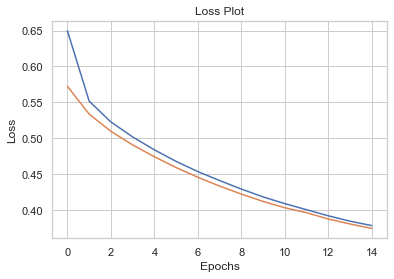

In [84]:
plt.plot(loss_plot)
plt.plot(test_loss_plot)
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss Plot')
plt.grid('off')
plt.show()

In [85]:
def evaluate(image):
    attention_plot = np.zeros((max_length, attention_features_shape))

    #hidden = decoder.reset_state(batch_size=1)
    hidden = decoder.init_state(batch_size=1)

    temp_input = tf.expand_dims(preprocess_images_function(image)[0], 0) #process the input image to desired format before extracting features
    img_tensor_val = image_features_extract_model(temp_input) # Extract features using our feature extraction model
    img_tensor_val = tf.reshape(img_tensor_val, (img_tensor_val.shape[0], -1, img_tensor_val.shape[3]))

    features = encoder(img_tensor_val)# extract the features by passing the input to encoder

    dec_input = tf.expand_dims([tokenizer.word_index['<start>']], 0)
    result = []

    for i in range(max_length):
        predictions, hidden, attention_weights = decoder(dec_input, features, hidden)# get the output from decoder

        attention_plot[i] = tf.reshape(attention_weights, (-1, )).numpy()

        predicted_id =  tf.argmax(predictions[0]).numpy()#extract the predicted id(embedded value) which carries the max value
        result.append(tokenizer.index_word[predicted_id])#map the id to the word from tokenizer and append the value to the result list

        if tokenizer.index_word[predicted_id] == '<end>':
            return result, attention_plot,predictions

        dec_input = tf.expand_dims([predicted_id], 0)

    attention_plot = attention_plot[:len(result), :]
    return result, attention_plot,predictions

In [86]:
def plot_attmap(caption, weights, image):

    fig = plt.figure(figsize=(10, 10))
    temp_img = np.array(Image.open(image))
    
    len_cap = len(caption)
    for cap in range(len_cap):
        weights_img = np.reshape(weights[cap], (8,8))
        weights_img = np.array(Image.fromarray(weights_img).resize((224, 224), Image.LANCZOS))
        
        ax = fig.add_subplot(len_cap//2, len_cap//2, cap+1)
        ax.set_title(caption[cap], fontsize=15)
        
        img=ax.imshow(temp_img)
        
        ax.imshow(weights_img, cmap='gist_heat', alpha=0.6,extent=img.get_extent())
        ax.axis('off')
    plt.subplots_adjust(hspace=0.2, wspace=0.2)
    plt.show()

In [87]:
from nltk.translate.bleu_score import sentence_bleu

In [88]:
def filt_text(text):
    filt=['<start>','<unk>','<end>'] 
    temp= text.split()
    [temp.remove(j) for k in filt for j in temp if k==j]
    text=' '.join(temp)
    return text

In [89]:
img_test=img_test_data.copy()

In [90]:
#modifying the given code as function to run it several times by changing weights
def predicted_caption_audio(random,autoplay=False,weights=(0.5, 0.5, 0, 0)):

    cap_test=caption_test_data.copy()
    rid = np.random.randint(0, random)
    test_image = img_test[rid]'

    real_caption = ' '.join([tokenizer.index_word[i] for i in cap_test[rid] if i not in [0]])
    result, attention_plot,pred_test = evaluate(test_image)

    real_caption=filt_text(real_caption)      

    pred_caption=' '.join(result).rsplit(' ', 1)[0]

    real_appn = []
    real_appn.append(real_caption.split())
    reference = real_appn
    candidate = pred_caption.split()

    score = sentence_bleu(reference, candidate, weights=weights)#set your weights)
    print(f"BLEU score: {score*100}")

    print ('Real Caption:', real_caption)
    print ('Prediction Caption:', pred_caption)
    plot_attmap(result, attention_plot, test_image)

    #Let's use Google Text to Speech Online API from playing the predicted caption as audio
    speech = gTTS("Predicted Caption is: "+ pred_caption,lang = 'en', slow = False) 
    speech.save('voice.mp3')
    audio_file = 'voice.mp3'
    #playsound('voice.wav')
    display.display(display.Audio(audio_file, rate=None,autoplay=autoplay))
    
    return test_image

/Users/dhruv/tensorflow-test/env/lib/python3.8/site-packages/nltk/translate/bleu_score.py:552: UserWarning: 
The hypothesis contains 0 counts of 2-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg)
/Users/dhruv/tensorflow-test/env/lib/python3.8/site-packages/nltk/translate/bleu_score.py:552: UserWarning: 
The hypothesis contains 0 counts of 3-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg)
/Users/dhruv/tensorflow-test/env/lib/python3.8/site-packages/nltk/translate/bleu_score.py:552: UserWarning: 
The hypothesis contains 0 counts of 4-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using 

BELU score: 4.3180842775472395e-76
Real Caption: toddler enjoying her birthday cake
Prediction Caption: little girl licks the last pieces of cake


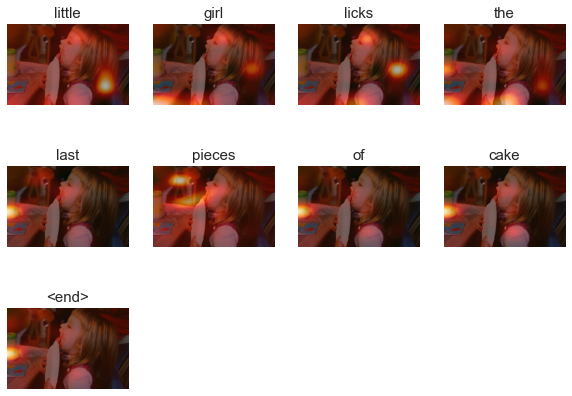

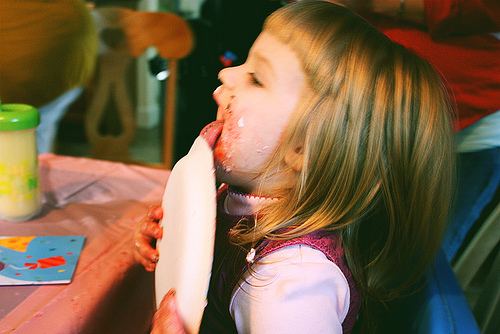

In [91]:
test_image=predicted_caption_audio(5,True,weights=(0.5,0.25,0,0))

Image.open(test_image)

/Users/dhruv/tensorflow-test/env/lib/python3.8/site-packages/nltk/translate/bleu_score.py:552: UserWarning: 
The hypothesis contains 0 counts of 2-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg)
/Users/dhruv/tensorflow-test/env/lib/python3.8/site-packages/nltk/translate/bleu_score.py:552: UserWarning: 
The hypothesis contains 0 counts of 3-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg)
/Users/dhruv/tensorflow-test/env/lib/python3.8/site-packages/nltk/translate/bleu_score.py:552: UserWarning: 
The hypothesis contains 0 counts of 4-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using 

BELU score: 6.528329793490376e-76
Real Caption: heavily tattooed musician is speaking into microphone
Prediction Caption: man with dreadlocks is playing the microphone


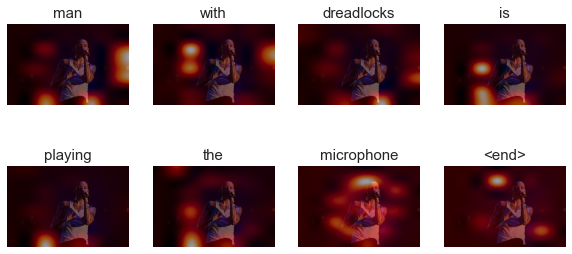

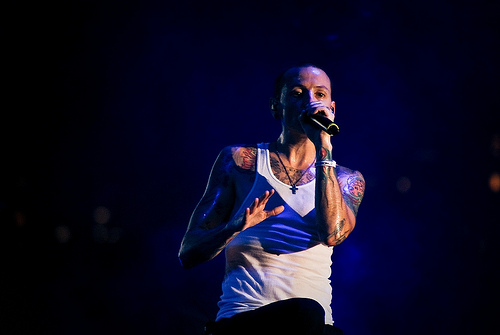

In [92]:
test_image=predicted_caption_audio(len(img_test),False,weights=(0.5,0.25,0,0))

Image.open(test_image)

/Users/dhruv/tensorflow-test/env/lib/python3.8/site-packages/nltk/translate/bleu_score.py:552: UserWarning: 
The hypothesis contains 0 counts of 2-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg)
/Users/dhruv/tensorflow-test/env/lib/python3.8/site-packages/nltk/translate/bleu_score.py:552: UserWarning: 
The hypothesis contains 0 counts of 3-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg)
/Users/dhruv/tensorflow-test/env/lib/python3.8/site-packages/nltk/translate/bleu_score.py:552: UserWarning: 
The hypothesis contains 0 counts of 4-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using 

BELU score: 5.218621439957678e-76
Real Caption: there is person riding tall bike in front of purple bus
Prediction Caption: man in black jacket and black jacket and black jacket and black jacket and black jacket and black jacket and black jacket and black jacket and black jacket and black


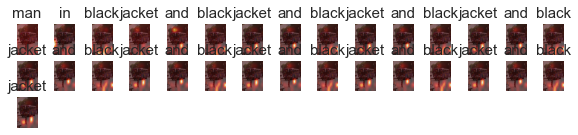

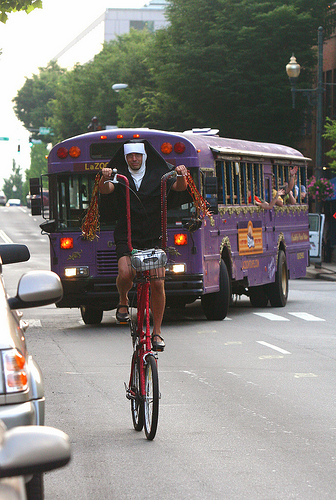

In [93]:
test_image1=predicted_caption_audio(len(img_test),False,weights=(0.25,0.25,0,0))

Image.open(test_image1)

/Users/dhruv/tensorflow-test/env/lib/python3.8/site-packages/nltk/translate/bleu_score.py:552: UserWarning: 
The hypothesis contains 0 counts of 2-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg)
/Users/dhruv/tensorflow-test/env/lib/python3.8/site-packages/nltk/translate/bleu_score.py:552: UserWarning: 
The hypothesis contains 0 counts of 3-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg)
/Users/dhruv/tensorflow-test/env/lib/python3.8/site-packages/nltk/translate/bleu_score.py:552: UserWarning: 
The hypothesis contains 0 counts of 4-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using 

BELU score: 2.6190505055554774e-76
Real Caption: fisherman in red baseball cap pulling net out of murky brown water
Prediction Caption: shirtless man in reddish orange shirt is fishing


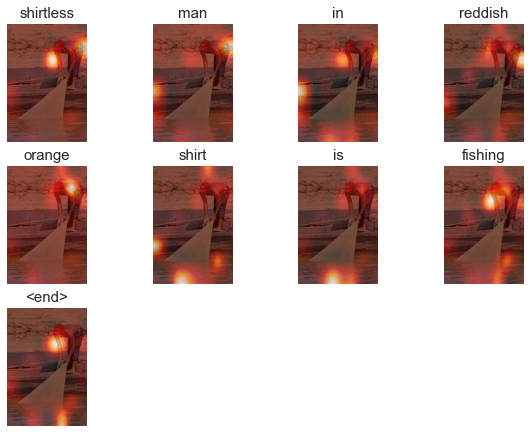

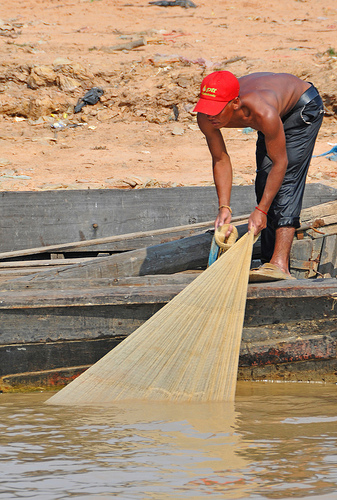

In [94]:
test_image=predicted_caption_audio(len(img_test),False,weights=(0.5,0.25,0,0))

Image.open(test_image)

/Users/dhruv/tensorflow-test/env/lib/python3.8/site-packages/nltk/translate/bleu_score.py:552: UserWarning: 
The hypothesis contains 0 counts of 4-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg)


BELU score: 22.49682245993741
Real Caption: young girl in green shirt eats green apple on the street
Prediction Caption: group of children are sitting on the street


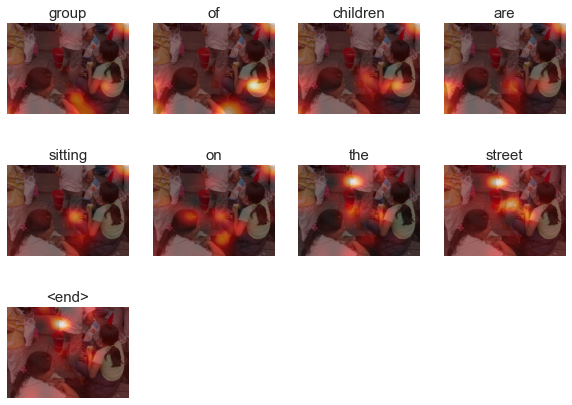

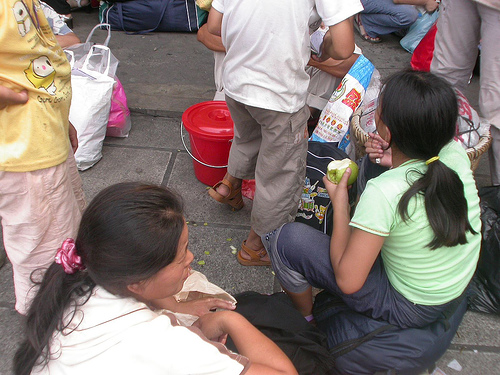

In [95]:
test_image=predicted_caption_audio(len(img_test),False,weights=(0.5,0.5,0,0))

Image.open(test_image)

/Users/dhruv/tensorflow-test/env/lib/python3.8/site-packages/nltk/translate/bleu_score.py:552: UserWarning: 
The hypothesis contains 0 counts of 3-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg)
/Users/dhruv/tensorflow-test/env/lib/python3.8/site-packages/nltk/translate/bleu_score.py:552: UserWarning: 
The hypothesis contains 0 counts of 4-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg)


BELU score: 5.837982894403099
Real Caption: two men with painted faces looking like clowns one singing and the other play an tiny guitar
Prediction Caption: two men are singing with microphone


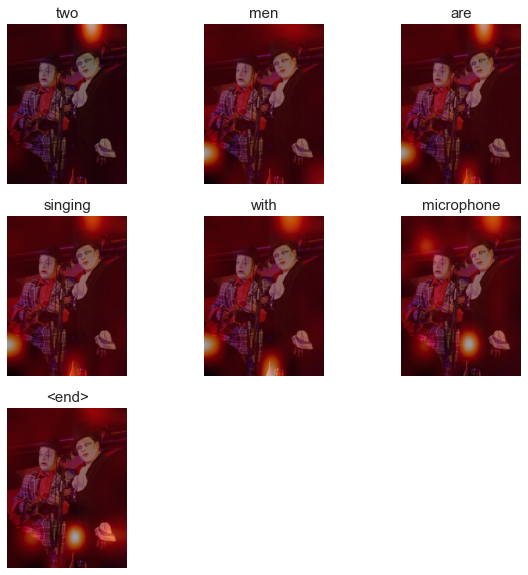

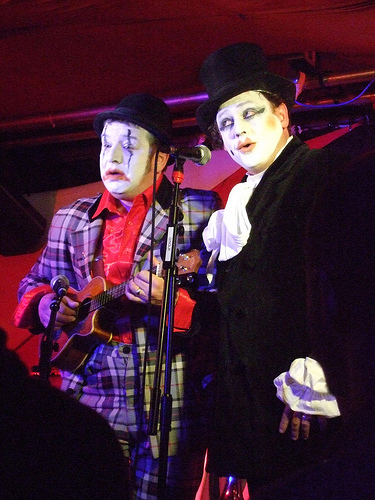

In [96]:
test_image=predicted_caption_audio(len(img_test),False,weights=(0.5,0.5,0,0))

Image.open(test_image)

BELU score: 0
Real Caption: two men get dropped off in town square
Prediction Caption: people are standing around the streets


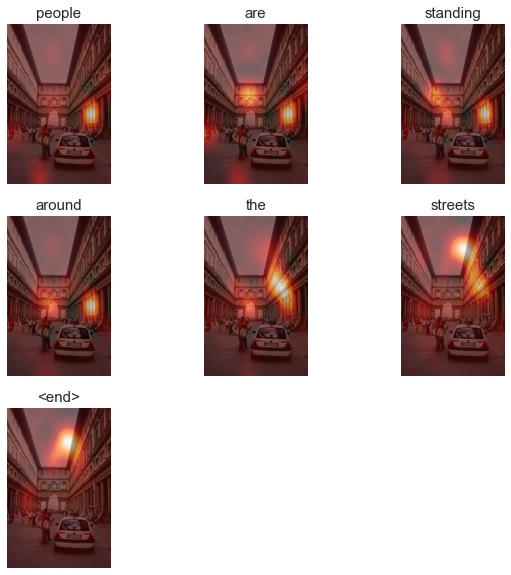

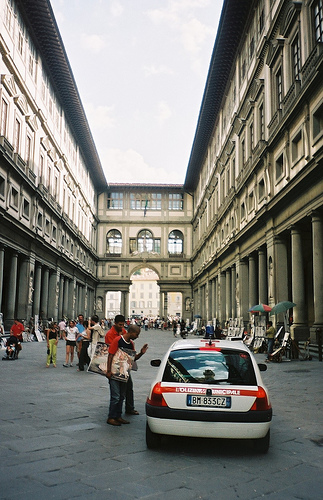

In [97]:
test_image=predicted_caption_audio(len(img_test),False,weights=(0.5,0.5,0,0))

Image.open(test_image)

/Users/dhruv/tensorflow-test/env/lib/python3.8/site-packages/nltk/translate/bleu_score.py:552: UserWarning: 
The hypothesis contains 0 counts of 2-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg)
/Users/dhruv/tensorflow-test/env/lib/python3.8/site-packages/nltk/translate/bleu_score.py:552: UserWarning: 
The hypothesis contains 0 counts of 3-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg)
/Users/dhruv/tensorflow-test/env/lib/python3.8/site-packages/nltk/translate/bleu_score.py:552: UserWarning: 
The hypothesis contains 0 counts of 4-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using 

BELU score: 8.612150057732662e-153
Real Caption: little girls is on swing outside
Prediction Caption: little girl swings herself in swing


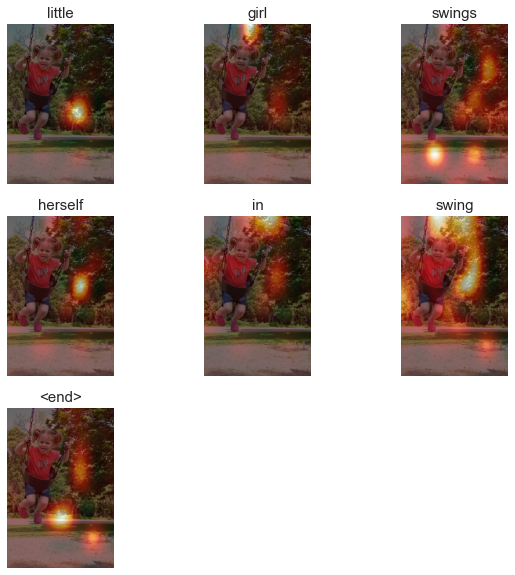

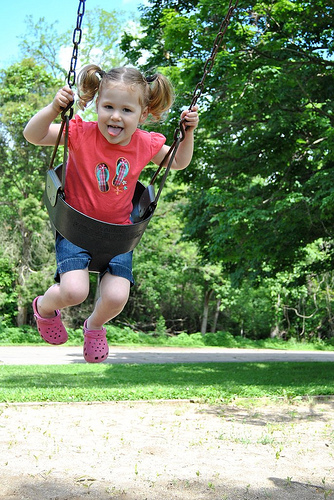

In [98]:
test_image=predicted_caption_audio(len(img_test),False,weights=(0.5,0.5,0,0))

Image.open(test_image)

/Users/dhruv/tensorflow-test/env/lib/python3.8/site-packages/nltk/translate/bleu_score.py:552: UserWarning: 
The hypothesis contains 0 counts of 2-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg)
/Users/dhruv/tensorflow-test/env/lib/python3.8/site-packages/nltk/translate/bleu_score.py:552: UserWarning: 
The hypothesis contains 0 counts of 3-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg)
/Users/dhruv/tensorflow-test/env/lib/python3.8/site-packages/nltk/translate/bleu_score.py:552: UserWarning: 
The hypothesis contains 0 counts of 4-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using 

BELU score: 8.465288316962106e-153
Real Caption: man is kite surfing away from the camera
Prediction Caption: man in wetsuit is surfing on surfboard


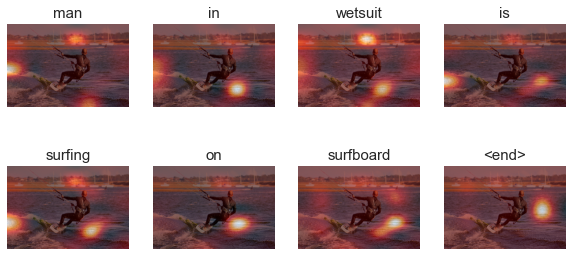

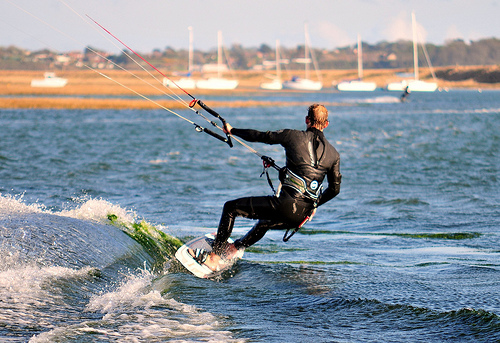

In [100]:
test_image=predicted_caption_audio(len(img_test),False,weights=(0.5,0.5,0,0))

Image.open(test_image)

/Users/dhruv/tensorflow-test/env/lib/python3.8/site-packages/nltk/translate/bleu_score.py:552: UserWarning: 
The hypothesis contains 0 counts of 3-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg)
/Users/dhruv/tensorflow-test/env/lib/python3.8/site-packages/nltk/translate/bleu_score.py:552: UserWarning: 
The hypothesis contains 0 counts of 4-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg)


BELU score: 18.257418583505533
Real Caption: man on laptop at table
Prediction Caption: man in black shirt is sitting at table in library


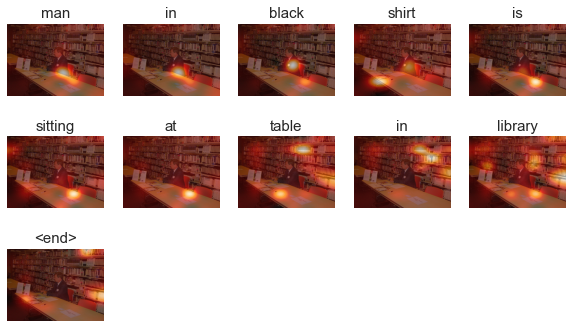

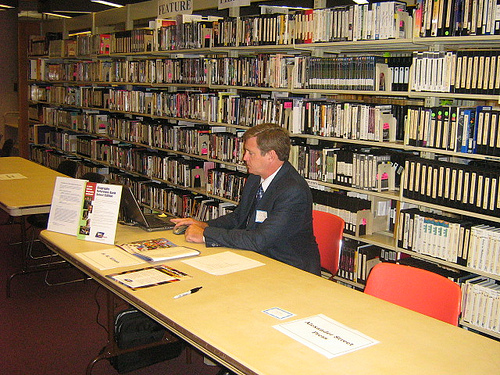

In [101]:
test_image=predicted_caption_audio(len(img_test),False,weights=(0.5,0.5,0,0))

Image.open(test_image)

/Users/dhruv/tensorflow-test/env/lib/python3.8/site-packages/nltk/translate/bleu_score.py:552: UserWarning: 
The hypothesis contains 0 counts of 3-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg)
/Users/dhruv/tensorflow-test/env/lib/python3.8/site-packages/nltk/translate/bleu_score.py:552: UserWarning: 
The hypothesis contains 0 counts of 4-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg)


BELU score: 31.6227766016838
Real Caption: nurse is bathing newborn baby
Prediction Caption: nurse is sitting in blanket


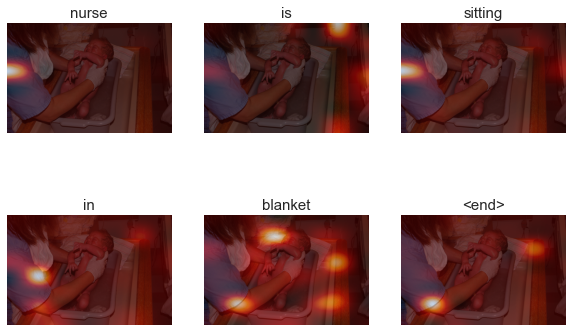

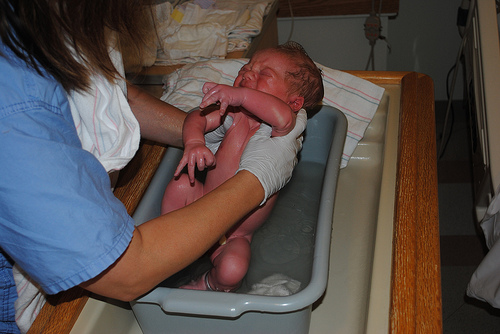

In [102]:
test_image=predicted_caption_audio(len(img_test),False,weights=(0.5,0.5,0,0))

Image.open(test_image)

/Users/dhruv/tensorflow-test/env/lib/python3.8/site-packages/nltk/translate/bleu_score.py:552: UserWarning: 
The hypothesis contains 0 counts of 3-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg)
/Users/dhruv/tensorflow-test/env/lib/python3.8/site-packages/nltk/translate/bleu_score.py:552: UserWarning: 
The hypothesis contains 0 counts of 4-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg)


BELU score: 20.412414523193153
Real Caption: group of five girls made human pyramid
Prediction Caption: group of young girls posing for picture in bedroom


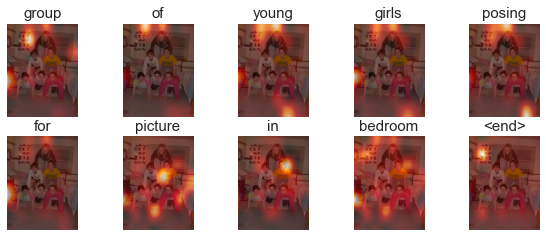

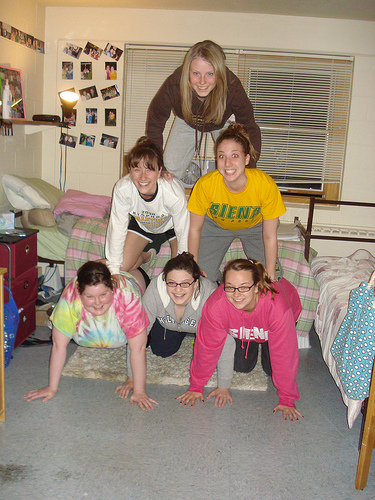

In [104]:
test_image=predicted_caption_audio(len(img_test),False,weights=(0.5,0.5,0,0))

Image.open(test_image)